In [1]:
from math import pi
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import wavio
import IPython

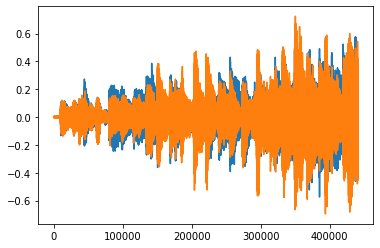

In [2]:
file = wavio.read("Open_Goldberg_Variatio_18a1-stereo.wav")
fixed_data0 = file.data[:, 0]
fixed_data1 = file.data[:, 1]
data0 = fixed_data0.astype(np.float32, order='C') / 32767.0
data1 = fixed_data1.astype(np.float32, order='C') / 32767.0

data0 = data0[:441000]
data1 = data1[:441000]

plt.plot(data0)
plt.plot(data1)
plt.show()

In [3]:
# n = 4096
# center = round((n-1)/2)
# fc = 0.03

# taps = -signal.firwin(n, cutoff = fc, window = "hamming")
# taps[center] = taps[center] + 1

# w, h = signal.freqz(taps * 0.025)

# amplitude = 20 * np.log10(abs(h))
# angle = np.unwrap(np.angle(h))

# fig, ax1 = plt.subplots()
# ax2 = ax1.twinx()

# plt.title('frequency response of FIR filter')
# plt.xlabel(r'normalized frequency (x$\pi$rad/sample)')

# ax1.plot(w/max(w), amplitude, 'g')
# ax1.set_ylabel('amplitude (dB)', color='g')
# ax1.set_ylim(-120, 6)
# ax1.grid()

# ax2.plot(w/max(w), angle, 'b--')
# ax2.set_ylabel('phase (radians)', color='b')

# plt.xscale("log")
# plt.show()

# data0 = signal.convolve(taps, data0)
# data1 = signal.convolve(taps, data1)

In [4]:
def PreProcessData(xn, frameSize, stepSize):
    padding = len(xn) % stepSize
    if(padding == 0):
        temp = xn
    else:
        temp = np.append(xn, np.zeros(stepSize - padding))
    
    # data = np.append(np.zeros(frameSize), temp)

    iteration = (len(temp) // stepSize) - (frameSize // stepSize) + 1
    
    dataSet = np.zeros([iteration, frameSize])
    
    for i in range(iteration):
        start = i * stepSize
        end = start + frameSize
        dataSet[i] = temp[start:end]
        
    return dataSet, temp, len(temp), iteration

In [5]:
frameSize = 2048
stepSize = 128
FS = 1
FA = 1
RA = 1

dataSet0, data0, length, iteration = PreProcessData(data0, frameSize, stepSize)
dataSet1, data1, length, iteration = PreProcessData(data1, frameSize, stepSize)

width = np.exp(np.pi * 0.6 * np.complex128(1j))
rms = np.sqrt(2) / 2
minimum  = 2.2250738585072014e-308

In [8]:
DIRECT = np.zeros(length)
DL = np.zeros(length)
DR = np.zeros(length)
DC = np.zeros(length)
NL = np.zeros(length)
NR = np.zeros(length)

aL_prev = np.zeros(frameSize)
aR_prev = np.zeros(frameSize)

leaking = 0.1

for i in range(iteration):
    
    fL = np.fft.fft(dataSet0[i])
    fR = np.fft.fft(dataSet1[i])
    
    distance = np.sqrt( np.abs(fL) ** 2 + np.abs(fR) ** 2)
    
    aL = np.abs(fL) / distance
    aR = np.abs(fR) / distance


    direct = np.zeros(frameSize, dtype = np.complex128)
    dc_mag = np.zeros(frameSize, dtype = np.complex128)
    dl =     np.zeros(frameSize, dtype = np.complex128)
    dr =     np.zeros(frameSize, dtype = np.complex128)
    nl =     np.zeros(frameSize, dtype = np.complex128)
    nr =     np.zeros(frameSize, dtype = np.complex128)
    dc =     np.zeros(frameSize, dtype = np.complex128)
    cl =     np.zeros(frameSize, dtype = np.complex128)
    cr =     np.zeros(frameSize, dtype = np.complex128)
    
    direct = (fL - fR)
    
#     dl = direct * aL
#     dr = direct * aR
    
#     dc_mag = rms * ( np.abs(dl + dr) - np.abs(dl - dr))
    
#     dc = ((dl + dr) * dc_mag) / (np.abs(dl + dr) + minimum)
    
#     cl = dl - dc * rms
#     cr = dr - dc * rms
#     cl[np.isnan(cl)] = 0
#     cr[np.isnan(cr)] = 0
    
#     nl = fL - dl
#     nr = fR - dr
    
    temp0 = np.fft.ifft(direct).real
    temp1 = np.fft.ifft(fL).real
    temp2 = np.fft.ifft(fR).real
    temp3 = np.fft.ifft(dc).real
    temp4 = np.fft.ifft(nl).real
    temp5 = np.fft.ifft(nr).real
    
    start = i * stepSize
    end = start + stepSize
    
    DIRECT[start : end] = temp0[-stepSize:]
    DL[start : end] = temp1[-stepSize:]
    DR[start : end] = temp2[-stepSize:]
    DC[start : end] = temp3[-stepSize:]
    NL[start : end] = temp4[-stepSize:]
    NR[start : end] = temp5[-stepSize:]

dataOut_0 = DIRECT
dataOut_1 = DL
dataOut_2 = DR
dataOut_3 = DC
dataOut_4 = NL
dataOut_5 = NR

In [9]:
wavio.write("output0.wav", dataOut_0, file.rate, sampwidth=3)
wavio.write("output1.wav", dataOut_1, file.rate, sampwidth=3)
wavio.write("output2.wav", dataOut_2, file.rate, sampwidth=3)
wavio.write("output3.wav", dataOut_3, file.rate, sampwidth=3)
wavio.write("output4.wav", dataOut_4, file.rate, sampwidth=3)
wavio.write("output5.wav", dataOut_5, file.rate, sampwidth=3)

IPython.display.display(IPython.display.Audio("output0.wav", rate=file.rate))
IPython.display.display(IPython.display.Audio("output1.wav", rate=file.rate))
IPython.display.display(IPython.display.Audio("output2.wav", rate=file.rate))
IPython.display.display(IPython.display.Audio("output3.wav", rate=file.rate))
IPython.display.display(IPython.display.Audio("output4.wav", rate=file.rate))
IPython.display.display(IPython.display.Audio("output5.wav", rate=file.rate))